# Imports

In [135]:
import pandas as pd
import numpy as np
import random
from sklearn.metrics.pairwise import cosine_distances, cosine_similarity
from scipy import spatial
from sklearn.cluster import KMeans, AgglomerativeClustering

from sklearn.preprocessing import PolynomialFeatures, Normalizer, MinMaxScaler

from flakylib import *
from numba import njit, prange

from rouge import Rouge 

from tqdm import tqdm_notebook
import pickle
import gc
import time

from transformers import BertTokenizer, BertModel
import nltk
import torch

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt

from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.linear_model import LogisticRegression

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, classification_report

In [ ]:
#rouge metric calc routine
def my_rouge(summary, reference):
    #delete punctuation?
    #tokenize
    
    tok_sum=summary.split(' ')#set(summary.split(' '))
    tok_ref=reference.split(' ')#set(reference.split(' '))
        
    overlap=sum([t in tok_ref for t in tok_sum])#tok_sum.intersection(tok_ref)
    if overlap==0:
        return 0
        
    recall=overlap/len(tok_ref)
    precision=overlap/len(tok_sum)
    f1=2*(precision*recall/(precision+recall))
        
    return f1#, precision, recall#, overlap


In [8]:
hypothesis = "the #### transcript is a written version of each day 's cnn student news program use this transcript to he    lp students with reading comprehension and vocabulary use the weekly newsquiz to test your knowledge of storie s you     saw on cnn student news"
reference = "this page includes the show transcript use the transcript to help students with reading comprehension and     vocabulary at the bottom of the page , comment for a chance to be mentioned on cnn student news . you must be a teac    her or a student age # # or older to request a mention on the cnn student news roll call . the weekly newsquiz tests     students ' knowledge of even ts in the news"

#rouge metric based on https://pypi.org/project/rouge/
def my_rouge2(hypothesis, reference):
    rouge = Rouge()
    scores = rouge.get_scores(hypothesis, reference)
    
    #rouge-1
    r1_f1=scores[0]['rouge-1']['f']
    r1_precision=scores[0]['rouge-1']['p']
    r1_recall=scores[0]['rouge-1']['r']
    
    #rouge-2
    r2_f1=scores[0]['rouge-2']['f']
    r2_precision=scores[0]['rouge-2']['p']
    r2_recall=scores[0]['rouge-2']['r']
    
    return r1_f1#, r2_f1, #, precision, recall

my_rouge2(hypothesis, reference)

0.4786324739396596

In [2]:
def save_obj(obj, name):
    pickle.dump(obj,open(name + '.pkl', 'wb'), protocol=4)
    
def load_obj(name):
    with open(name + '.pkl', 'rb') as f:
        return pickle.load(f)

# Load Dataset

## arXive

In [9]:
df=pd.read_json('arxiv_dataset/train.txt', lines=True)
df.head()

,abstract_text,article_id,article_text,labels,section_names,sections
0,[<S> additive models play an important role in...,1405.3379,[additive models @xcite provide an important f...,NaN,"[introduction, main results on learning rates,...",[[additive models @xcite provide an important ...
1,[<S> we have studied the leptonic decay @xmath...,0901.1147,[the leptonic decays of a charged pseudoscalar...,NaN,"[[sec:introduction]introduction, [sec:detector...",[[the leptonic decays of a charged pseudoscala...
2,"[<S> in 84 , 258 ( 2000 ) , mateos conjectured...",nlin0608019,[the transport properties of nonlinear non - e...,NaN,"[introduction, regularity and chaos in single-...",[[the transport properties of nonlinear non - ...
3,[<S> the effect of a random phase diffuser on ...,0903.5449,[studies of laser beams propagating through tu...,NaN,"[introduction, the method of photon distributi...",[[studies of laser beams propagating through t...
4,[<S> with a special intention of clarifying th...,hep-ph0605279,[the so - called `` nucleon spin crisis '' rai...,NaN,"[introduction, model lagrangian with pion mass...",[[the so - called `` nucleon spin crisis '' ra...


In [5]:
#how many words per article on averaage?
sum([len(' '.join(df.article_text[i]).split()) for i in tqdm_notebook(range(df.shape[0]))])/df.shape[0]

6038.185296276049

In [10]:
#extracting a sample of 20 000 articles
df2=df.sample(n=20000, random_state=1)
df2.head()

,abstract_text,article_id,article_text,labels,section_names,sections
102318,[<S> we attempt to measure the proper motions ...,0810.4184,[the sources known as magnetars ( see @xcite f...,NaN,"[introduction, observations, x-ray astrometry,...",[[the sources known as magnetars ( see @xcite ...
200586,[<S> we have mapped the barred spiral ngc 5383...,astro-ph9911280,[we observed ngc 5383 in a broad band ( @xmat...,NaN,"[observations and data reductions, results, di...",[[we observed ngc 5383 in a broad band ( @xma...
90456,[<S> the fourier transform of generalized part...,hep-ph0207047,[deep - inelastic scattering ( dis ) experimen...,NaN,"[introduction, impact parameter dependent part...",[[deep - inelastic scattering ( dis ) experime...
106219,[<S> annotated speech corpora are databases co...,cs0204026,"[we are grateful to peter buneman , mark liber...",NaN,[acknowledgements],"[[we are grateful to peter buneman , mark libe..."
104801,[<S> we consider the nonstationary circuit qed...,1504.04783,[the subject of photon generation in nonstatio...,NaN,"[introduction, mathematical formalism, two-exc...",[[the subject of photon generation in nonstati...


In [11]:
#cleanup
del df

In [12]:
gc.collect()

114

## Biomed

In [61]:
devcorp_full_text_vec=load_obj('devcorp_full_text_vec')

In [107]:
#Load abstracts

def get_texts_in_dir(path):
    files=os.listdir(path)
    files=[f for f in files if '.txt' in f]
    absts=[]
    for f in tqdm_notebook(files):
        fl=open(path+'/'+f, 'r', encoding='cp1251')
        text=fl.readlines()
        text=remove_stopwords(''.join(text).replace('\n',' ').split('.'))
        #vec=client.encode(text, is_tokenized=False)
        absts.append([f,text])
    return absts

In [115]:
devcorp_abstracts=get_texts_in_dir('BERT-based-Summ-master/Development Corpus/Dev Corpus-Abstracts')

In [108]:
devcorp_texts=get_texts_in_dir('BERT-based-Summ-master/Development Corpus/Dev Corpus-FullTexts')

In [116]:
#prepare the biomed abstracts df
biomed_ds_abs=pd.DataFrame(devcorp_abstracts, columns=['File_name', 'Abstract'])
biomed_ds_abs.sort_values(by='File_name', inplace=True)
biomed_ds_abs.reset_index(inplace=True, drop=True)
biomed_ds_abs.head()

,File_name,Abstract
0,Abstract-1.txt,[There is strong evidence that genetic factors...
1,Abstract-10.txt,[Although there are studies investigating the ...
2,Abstract-100.txt,[Criteria for the WHO algorithm for diagnosing...
3,Abstract-1000.txt,[We aimed to determine the role of palliative ...
4,Abstract-101.txt,[Plant extracts are sources of valuable compou...


In [78]:
#prepare the biomed text vecs df
biomed_ds=pd.DataFrame(devcorp_full_text_vec, columns=['File_name', 'Vecs'])
biomed_ds.sort_values(by='File_name', inplace=True)
biomed_ds.reset_index(inplace=True, drop=True)
biomed_ds.head()

,File_name,Vecs
0,FullText-1.txt,"[[0.29929987, 0.14180118, -0.18322647, 0.42094..."
1,FullText-10.txt,"[[-0.11689575, 0.08233172, 0.24786858, 0.41903..."
2,FullText-100.txt,"[[-0.24983776, 0.12131643, -0.12539405, 0.5224..."
3,FullText-1000.txt,"[[0.018530672, 0.4086275, -0.29987925, 0.40920..."
4,FullText-101.txt,"[[0.07252229, 0.10114202, -0.18374856, 0.51104..."


In [109]:
#prepare the biomed full texts df
biomed_ft_ds=pd.DataFrame(devcorp_texts, columns=['File_name2', 'Texts'])
biomed_ft_ds.sort_values(by='File_name2', inplace=True)
biomed_ft_ds.reset_index(inplace=True, drop=True)
biomed_ft_ds.head()

,File_name2,Texts
0,FullText-1.txt,[It has long been recognized that psychiatric ...
1,FullText-10.txt,[Mild cognitive impairment MCI is a clinical d...
2,FullText-100.txt,[Undiagnosed tuberculosis is a major cause of ...
3,FullText-1000.txt,[Approximately of patients with colorectal can...
4,FullText-101.txt,[The AIDS epidemic is the result of one of the...


In [117]:
#concat biomed abstracts with text vecs
biomed_fin_ds=pd.concat([biomed_ds,biomed_ds_abs, biomed_ft_ds], axis=1)
biomed_fin_ds.head()

,File_name,Vecs,File_name,Abstract,File_name2,Texts
0,FullText-1.txt,"[[0.29929987, 0.14180118, -0.18322647, 0.42094...",Abstract-1.txt,[There is strong evidence that genetic factors...,FullText-1.txt,[It has long been recognized that psychiatric ...
1,FullText-10.txt,"[[-0.11689575, 0.08233172, 0.24786858, 0.41903...",Abstract-10.txt,[Although there are studies investigating the ...,FullText-10.txt,[Mild cognitive impairment MCI is a clinical d...
2,FullText-100.txt,"[[-0.24983776, 0.12131643, -0.12539405, 0.5224...",Abstract-100.txt,[Criteria for the WHO algorithm for diagnosing...,FullText-100.txt,[Undiagnosed tuberculosis is a major cause of ...
3,FullText-1000.txt,"[[0.018530672, 0.4086275, -0.29987925, 0.40920...",Abstract-1000.txt,[We aimed to determine the role of palliative ...,FullText-1000.txt,[Approximately of patients with colorectal can...
4,FullText-101.txt,"[[0.07252229, 0.10114202, -0.18374856, 0.51104...",Abstract-101.txt,[Plant extracts are sources of valuable compou...,FullText-101.txt,[The AIDS epidemic is the result of one of the...


In [122]:
biomed_fin_ds.to_csv('biomed_fin_ds.csv', index=False, encoding='cp1251')

In [124]:
#collect word stats on Biomed corpus
abst_wcount=[len(' '.join(a).split(' ')) for a in tqdm_notebook(biomed_fin_ds.Abstract)]
print('Abstracts average word count',sum(abst_wcount)/len(abst_wcount))

artcl_wcount=[len(' '.join(a).split(' ')) for a in tqdm_notebook(biomed_fin_ds.Texts)]
print('Article average word count',sum(artcl_wcount)/len(artcl_wcount))


Abstracts average word count 175.519



Article average word count 3238.34


## Load saved and preprocessed datasets

### arXive

In [211]:
#loading the saved dataset to avoid repeating the tedious preprocessing task again
df2=load_obj('df2_VNS')#.iloc[:100,:]
df2.head()

,abstract_text,article_id,article_text,labels,section_names,sections
102318,[S we attempt to measure the proper motions of...,0810.4184,[the sources known as magnetars see for a revi...,NaN,"[introduction, observations, x-ray astrometry,...",[[the sources known as magnetars ( see @xcite ...
200586,[S we have mapped the barred spiral ngc using ...,astro-ph9911280,[we observed ngc in a broad band r filter and ...,NaN,"[observations and data reductions, results, di...",[[we observed ngc 5383 in a broad band ( @xma...
90456,[S the fourier transform of generalized parton...,hep-ph0207047,[deep inelastic scattering dis experiments hav...,NaN,"[introduction, impact parameter dependent part...",[[deep - inelastic scattering ( dis ) experime...
106219,[S annotated speech corpora are databases cons...,cs0204026,[we are grateful to peter buneman mark liberma...,NaN,[acknowledgements],"[[we are grateful to peter buneman , mark libe..."
104801,[S we consider the nonstationary circuit qed a...,1504.04783,[the subject of photon generation in nonstatio...,NaN,"[introduction, mathematical formalism, two-exc...",[[the subject of photon generation in nonstati...


In [4]:
df2.shape

(20000, 6)

### Biomed

In [186]:
biomed_fin_ds=pd.read_csv('biomed_fin_ds.csv', encoding='cp1251')
biomed_fin_ds.head()

,File_name,Vecs,File_name.1,Abstract,File_name2,Texts
0,FullText-1.txt,[[ 0.29929987 0.14180118 -0.18322647 ... -0.2...,Abstract-1.txt,['There is strong evidence that genetic factor...,FullText-1.txt,['It has long been recognized that psychiatric...
1,FullText-10.txt,[[-0.11689575 0.08233172 0.24786858 ... 0.0...,Abstract-10.txt,['Although there are studies investigating the...,FullText-10.txt,['Mild cognitive impairment MCI is a clinical ...
2,FullText-100.txt,[[-0.24983776 0.12131643 -0.12539405 ... 0.0...,Abstract-100.txt,['Criteria for the WHO algorithm for diagnosin...,FullText-100.txt,['Undiagnosed tuberculosis is a major cause of...
3,FullText-1000.txt,[[ 0.01853067 0.4086275 -0.29987925 ... 0.0...,Abstract-1000.txt,['We aimed to determine the role of palliative...,FullText-1000.txt,['Approximately of patients with colorectal ca...
4,FullText-101.txt,[[ 0.07252229 0.10114202 -0.18374856 ... -0.4...,Abstract-101.txt,['Plant extracts are sources of valuable compo...,FullText-101.txt,['The AIDS epidemic is the result of one of th...


In [187]:
biomed_fin_ds.shape

(1000, 6)

# Text preprocess

Removing the formulas and special symbols, but leaving the stopwords for them to carry in the context for the meaningful words.

In [37]:
import nltk
#nltk.download('punkt')


In [38]:
#todo - some sentences are weird and short, fix
#remove stopwords
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
stop_words.add('xcite')


from nltk.tokenize import word_tokenize

def remove_stopwords(t):
    ss=[]
    for s in t:
        tokens = word_tokenize(s)
        #s = ' '.join([i for i in tokens if not i in stop_words and i.isalpha() and len(i)>1])
        s = ' '.join([i for i in tokens if i.isalpha() and i!='xcite'])
        if s!='': 
            ss.append(s)
    return ss

#remove_stopwords(df2.article_text[102318])

In [15]:
stop_words

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [16]:
#processing the texts
df2.abstract_text=df2.abstract_text.apply(remove_stopwords)
df2.article_text=df2.article_text.apply(remove_stopwords)
df2.head()

,abstract_text,article_id,article_text,labels,section_names,sections
102318,[S we attempt to measure the proper motions of...,0810.4184,[the sources known as magnetars see for a revi...,NaN,"[introduction, observations, x-ray astrometry,...",[[the sources known as magnetars ( see @xcite ...
200586,[S we have mapped the barred spiral ngc using ...,astro-ph9911280,[we observed ngc in a broad band r filter and ...,NaN,"[observations and data reductions, results, di...",[[we observed ngc 5383 in a broad band ( @xma...
90456,[S the fourier transform of generalized parton...,hep-ph0207047,[deep inelastic scattering dis experiments hav...,NaN,"[introduction, impact parameter dependent part...",[[deep - inelastic scattering ( dis ) experime...
106219,[S annotated speech corpora are databases cons...,cs0204026,[we are grateful to peter buneman mark liberma...,NaN,[acknowledgements],"[[we are grateful to peter buneman , mark libe..."
104801,[S we consider the nonstationary circuit qed a...,1504.04783,[the subject of photon generation in nonstatio...,NaN,"[introduction, mathematical formalism, two-exc...",[[the subject of photon generation in nonstati...


In [22]:
save_obj(df2, 'df2_VNS')

# Vectorize words using BERT

## Bert-as-service

In [18]:
from bert_serving.client import BertClient
'''
Starting server from the shell:
$bert-serving-start -pooling_layer -11 -12 -model_dir BERT_12_768_cased/ -num_worker=30
$bert-serving-start -pooling_layer -4 -3 -2 -1 -model_dir /tmp/english_L-12_H-768_A-12/
'''
client = BertClient()

## PyTorch

In [17]:
use_gpu = False # Use GPU for text vectorization
n_combined_hidden_states = 1 # Number of last hidden states for combining to single vector
pooling_mode = 0 # pooling strategy for BERT-embeddings

def tokenize(text):
    return text.split('. ')

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased', output_hidden_states = True)
model.eval()

if use_gpu:
    model.to('cuda')
    

def sentence2bert_hidden_states(sentence, tokenizer, model, use_gpu = True):
    indexed_tokens = tokenizer.encode(sentence)
    tokens_tensor = torch.tensor([indexed_tokens])
    if use_gpu:
        tokens_tensor = tokens_tensor.to('cuda')
    with torch.no_grad():
        outputs = model(tokens_tensor)        
    hidden_states = outputs[2]
    hidden_states = torch.stack(hidden_states, dim=0)
    hidden_states = torch.squeeze(hidden_states, dim=1)
    hidden_states = hidden_states.permute(1,0,2)    
    return hidden_states, indexed_tokens


def combine_hidden_states(hidden_states, n_summands):
    n = hidden_states.shape[0]    
    assert n_summands <= hidden_states.shape[1]    
    combined = np.empty((hidden_states.shape[0],hidden_states.shape[2]))
    for i in range(n):
        combined[i,:] = torch.sum(hidden_states[i][-n_summands:], dim=0).cpu()[:]
    return combined


def sentence2token_embeddings(sentence, tokenizer, model, use_gpu = True, n_combined_hidden_states = 4):
    hidden_states, indexed_tokens = sentence2bert_hidden_states(sentence, tokenizer, model, use_gpu)
    token_embeddings = combine_hidden_states(hidden_states, n_combined_hidden_states)
    return token_embeddings, indexed_tokens


# Sentence vectorization
def sentence2embedding(sentence, tokenizer, model, use_gpu = True, n_combined_hidden_states = 4, pooling_mode = 0):
    token_embeddings, indexed_tokens = sentence2token_embeddings(sentence, tokenizer, model, use_gpu, n_combined_hidden_states)
    if pooling_mode == 0:
        return token_embeddings[0]
    else:
        return np.mean(token_embeddings, axis = 0)
    

# Splitting text into sentences and sentence by sentence vectorization
def text2sentence_embeddings(text, tokenizer, model, use_gpu = True, n_combined_hidden_states = 4, pooling_mode = 0):
    text_sentences = np.array(tokenize(text))#nltk.sent_
    n_text_sentences = len(text_sentences)
    text_embeddings = np.empty((n_text_sentences, model.config.hidden_size))
    for i in range(n_text_sentences):
        text_embeddings[i,:] = sentence2embedding(text_sentences[i], tokenizer, model, use_gpu, n_combined_hidden_states, pooling_mode)[:]
    return text_sentences, text_embeddings

I0715 11:26:40.451462 139621948430144 tokenization_utils.py:501] loading file https://s3.amazonaws.com/models.huggingface.co/bert/bert-base-uncased-vocab.txt from cache at /home/ubuntu/.cache/torch/transformers/26bc1ad6c0ac742e9b52263248f6d0f00068293b33709fae12320c0e35ccfbbb.542ce4285a40d23a559526243235df47c5f75c197f04f37d1a0c124c32c9a084
I0715 11:26:41.298263 139621948430144 configuration_utils.py:256] loading configuration file https://s3.amazonaws.com/models.huggingface.co/bert/bert-base-uncased-config.json from cache at /home/ubuntu/.cache/torch/transformers/4dad0251492946e18ac39290fcfe91b89d370fee250efe9521476438fe8ca185.7156163d5fdc189c3016baca0775ffce230789d7fa2a42ef516483e4ca884517
I0715 11:26:41.300133 139621948430144 configuration_utils.py:292] Model config BertConfig {
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "bos_token_id": null,
  "do_sample": false,
  "eos_token_ids": null,
  "finetuning_task": null,
  "hidden_act": "gelu",


# Summarizing

## Calculating best possible rouge summary

For each text going over random combinations of sentences 
$C\binom ad$
where, **a** - is the number of sentences in the abstract, and **d** - is the number of sentences in the respective document,
and calculating it's ROUGE score against the available golden summary. The process is repeated in 2 variants - with and without VNS. Then keep the best obtained summary.

### arXive

In [6]:
#VNS to find best rouge available

#from bert_serving.client import BertClient
#client=BertClient(check_length=False)

def vns_best_sum(text, abstract):
    #initial random summary
    d=len(text)
    a=len(abstract)
    g_sum='. '.join(abstract)
    
    sent_sample=random.sample(range(d), a)
    
    best_sum='. '.join([text[i] for i in sent_sample])
    
    #use the sum of cosine distances between sentences in summary and the text
    best_objective=my_rouge2(best_sum,g_sum)#cosine_distances(summary_vecs, text_vecs).sum()

    #VNS
    k_max=3
    max_cpu_time=60
    max_iterations=10000
    ni_lim=700 #no improvement iterations limit

    k = 1
    n_iters = 0 # Инициализируем счётчик итераций
    ni=0
    start_time = time.perf_counter() # Фиксcurrent_time = time.perf_counter()
    cpu_time = 0

    while (cpu_time < max_cpu_time) and (n_iters < max_iterations):#(cpu_time < max_cpu_time) and 
        s=sent_sample
        #select random indices to change in initial solution
        ind_change = random.sample(range(len(s)), k)
        #delete indexes to change
        s=[s[i] for i in range(a) if i not in ind_change]

        #generate new indices and add them to the summary sentence list
        while len(s)<a+k:
            j=random.randint(0,d-1)
            if j not in s:
                s.append(j)
        
        #generate new summary 
        neighbourhood='. '.join([text[i] for i in s])
        objective=my_rouge2(neighbourhood, g_sum)
        #print('nq_metric', nq_metric, 'q_metric', q_metric)
        if objective>best_objective:
            best_sum=neighbourhood
            best_objective=objective
            sent_sample=s
            #print(best_objective,k,n_iters, ni)
            k=1
        else:
            if k<k_max:
                k+=1
            ni+=1
            
        #update the counters
        cpu_time = time.perf_counter() - start_time
        n_iters+=1
        
        if ni==ni_lim:
            print('No ROUGE-1 improvement on more than 700 iterations. Exit.')
            break
    
    #get the final summary rouge score
    sent_sample.sort()
    #print(sent_sample)
    final_summary=[text[i] for i in sent_sample]
    is_sum_sent=[1 if s in final_summary else 0 for s in text]
    r=my_rouge2('. '.join(final_summary), g_sum)
    #print('n_iters',n_iters)
    return r, final_summary, is_sum_sent

In [30]:
text=df2.article_text.iloc[1]
abstract=df2.abstract_text.iloc[1]
r,s, issumsent=vns_best_sum(text, abstract)
print(r,s)

0.559225507534707 ['we observed ngc in a broad band r filter and a narrow band filter at the m telescope at palomar on the night of june with a ccd camera in direct imaging mode in this mode', 'the phase and pointing center for these observations was', 'we summed over all pixels in the data cube with to form a velocity integrated total intensity map which is shown in figure cofig', 'this is about of the flux k measured from the nrao spectrum assuming a conversion factor of jy k for the m telescope', 'prior to division the images were registered against each other and the higher resolution images were smoothed to match the lower resolution of the k band image in both maps', 'interior to these peaks a s shaped curve is traced in dust extinction similar to the curve seen in co emission at the center of the s shaped curve', 'while the nuclear region and the bar ends have strong emission the bar itself is comparatively weak this pattern is consistent with observations of other early type ba

In [9]:
#prepare the data for classification
X_sent=[]
Y=[]
best_rouges=[]
art_num=100
c=0
for t,a in zip(tqdm_notebook(df2.article_text), df2.abstract_text):
    if len(t)>len(a) and len(a)>=5:
        r,s, issumsent=vns_best_sum(t, a)
        X_sent=X_sent+t
        Y=Y+issumsent
        best_rouges=best_rouges+[r]
        c+=1
        if c==100:
            break

No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 improvement on more than 700 iterations. Exit.
No ROUGE-1 imp

In [10]:
print(len(X_sent), len(Y), len(best_rouges))

23235 23235 100


In [11]:
sum(best_rouges)/len(best_rouges)

0.5522050746847438

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7efa1d522eb8>]],
      dtype=object)

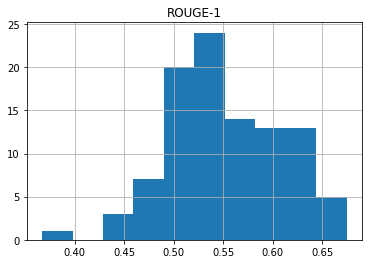

In [50]:
ds=pd.DataFrame(best_rouges, columns=['ROUGE-1'])
ds.hist()

In [51]:
ds.describe()

,ROUGE-1
count,100.000000
mean,0.552205
std,0.058205
min,0.366972
25%,0.511357
50%,0.546785
75%,0.594436
max,0.674699


In [14]:
save_obj(X_sent,'X_sent')

In [15]:
save_obj(Y,'Y')

In [16]:
save_obj(best_rouges,'best_rouges')

## Vectorize sentences using BERT PyTorch

In [18]:
text_sentences, text_embeddings = text2sentence_embeddings('. '.join(X_sent), 
                                                           tokenizer, 
                                                           model, 
                                                           use_gpu, 
                                                           n_combined_hidden_states, 
                                                           pooling_mode)


In [19]:
text_embeddings.shape

(23235, 768)

In [20]:
save_obj(text_embeddings, 'text_embeddings100_arXive')

#### Visualize data

In [21]:
import plotly.graph_objects as go

#reduce dimensionality
pca = PCA(n_components=2)#, whiten=True
X_pca=pca.fit_transform(text_embeddings)

data= pd.DataFrame(X_pca, columns=['1','2'])

fig = go.Figure(data=go.Scatter(x=data['1'],
                                y=data['2'],
                                mode='markers',
                                marker_color=Y
                                )) # hover text goes here

#fig.update_layout(title='Population of USA States')
fig.show()

In [122]:
from scipy.stats import pearsonr
# calculate Pearson's correlation
corr=np.array([pearsonr(text_embeddings[:,i], Y)[0] for i in range(text_embeddings.shape[1])])
idx=corr.argsort()[-20:]
corr[idx]

array([0.05954169, 0.06015134, 0.06034701, 0.06183385, 0.06215097,
       0.06225394, 0.06258153, 0.06355632, 0.06423438, 0.06488167,
       0.06549737, 0.06660761, 0.06676873, 0.07125757, 0.071966  ,
       0.07349946, 0.07524058, 0.07526082, 0.07650414, 0.08235961])

Clearly very low correlation with target is observed

## Produce cluster embeddings

In [ ]:
#Cluster text embeddings
cluster=KMeans(n_clusters=100).fit(text_embeddings)

counter = Counter(cluster.labels_)
print(counter)

In [164]:
#Calc cosine similarity of each sentence emedding to the centroids
clust_emb=[[cosine_similarity(s.reshape(1, -1),c.reshape(1, -1)) for c in cluster.cluster_centers_] for s in tqdm_notebook(text_embeddings)]

In [173]:
clust_emb_prob=[(np.array(e).flatten()/sum(e)).flatten() for e in tqdm_notebook(clust_emb)]

In [176]:
len(clust_emb_prob[0])

100

In [177]:
save_obj(clust_emb_prob,'clust_emb_prob')

In [215]:
save_obj(cluster,'cluster')

In [216]:
cluster=load_obj('cluster')

In [217]:
def bert2clust_emb(bert_text_emb):
    
    clust_emb=[[cosine_similarity(s.reshape(1, -1),c.reshape(1, -1)) for c in cluster.cluster_centers_] for s in tqdm_notebook(bert_text_emb)]
    clust_emb_prob=[(np.array(e).flatten()/sum(e)).flatten() for e in tqdm_notebook(clust_emb)]
    return clust_emb_prob

## Modeling

### Balancing the dataset

In [182]:
#train test split
X_train, X_test, y_train, y_test = train_test_split(clust_emb_prob, Y, test_size=0.33, random_state=0)

In [24]:
#balancing

#oversampling
'''
sm = SMOTE(sampling_strategy='auto', n_jobs=10)#kind='regular', 
X_SMOTE, y_SMOTE = sm.fit_sample(X_train, y_train)
'''



In [125]:
#undersampling
from collections import Counter
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.under_sampling import RandomUnderSampler

In [191]:
# summarize class distribution
counter = Counter(y_train)
print(counter)

Counter({0: 14752, 1: 815})


In [192]:
# define the undersampling method
undersample = RandomUnderSampler(sampling_strategy=0.5)

# transform the dataset
X_RUS, y_RUS = undersample.fit_resample(X_train, y_train)

# summarize the new class distribution
counter = Counter(y_RUS)
print(counter)

Counter({0: 1630, 1: 815})


#### Visualize

In [180]:
import plotly.graph_objects as go

#reduce dimensionality
pca = PCA(n_components=2)#, whiten=True
X_pca=pca.fit_transform(clust_emb_prob)

data= pd.DataFrame(X_pca, columns=['1','2'])

fig = go.Figure(data=go.Scatter(x=data['1'],
                                y=data['2'],
                                mode='markers',
                                marker_color=Y
                                )) # hover text goes here

#fig.update_layout(title='Population of USA States')
fig.show()

### Select classification model

In [90]:
models=[DecisionTreeClassifier(random_state=0), 
        ExtraTreesClassifier(n_jobs=-2, random_state=0), 
        #KNeighborsClassifier(3,n_jobs=-1),
        SVC(kernel="poly", C=2),
        #SVC(gamma=2, C=1),
        #GaussianProcessClassifier(1.0 * RBF(1.0)),
        RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1, n_jobs=-2, random_state=0),
        MLPClassifier(alpha=1, random_state=0),
        #AdaBoostClassifier(),
        GaussianNB(),
        #QuadraticDiscriminantAnalysis()
        LogisticRegression(random_state=0)
       ]

In [193]:
for m in tqdm_notebook(models):
    m_name=str(m)[:str(m).index('(')]
    cval=cross_val_score(m, X_RUS, y_RUS, cv=3, n_jobs=-2).mean()#, pre_dispatch=6, verbose=10
    print('%s cross validation: %s' % (m_name,cval))

DecisionTreeClassifier cross validation: 0.6028629856850716
ExtraTreesClassifier cross validation: 0.6773006134969325
SVC cross validation: 0.6449897750511248
RandomForestClassifier cross validation: 0.689161554192229
MLPClassifier cross validation: 0.6666666666666666
GaussianNB cross validation: 0.5893660531697341
LogisticRegression cross validation: 0.6666666666666666


### Train best model

In [202]:
best_model=RandomForestClassifier().fit(X_train, y_train)
##n_jobs=-2,ExtraTreesClassifier(n_jobs=-2, random_state=0)
#RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1, n_jobs=-2, random_state=0)
#SVC(kernel="poly", C=2, degree=9)
best_model.score(X_test,y_test)

0.9520083463745436

In [203]:
best_model.score(X_train,y_train)

0.9956317851866127

In [205]:
#confusion matrix
def plot_confusion_matrix(df_confusion, title='Confusion matrix', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion, cmap=cmap) # imshow
    #plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns, rotation=45)
    plt.yticks(tick_marks, df_confusion.index)
    #plt.tight_layout()
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)    

y_pred=best_model.predict(X_test)

y_actu = pd.Series(y_test, name='Actual')
y_pred = pd.Series(y_pred, name='Predicted')
df_confusion = pd.crosstab(y_actu, y_pred)


df_confusion
#plot_confusion_matrix(df_confusion)




Predicted,0,1
Actual,,
0,7264,1
1,367,36


In [206]:
tp=df_confusion.iloc[1,1]
tn=df_confusion.iloc[0,0]
fp=df_confusion.iloc[0,1]
fn=df_confusion.iloc[1,0]
tpr=tp/(tp+fn)
tnr=tn/(tn+fp)
precision=tp/(tp+fp)
recall=tp/(tp+fn)
print('Precision', precision)
print('Recall', recall)
print('Balanced accuracy',(tpr+tnr)/2)
print('F1',2*(precision*recall/(precision+recall)))

Precision 0.972972972972973
Recall 0.08933002481389578
Balanced accuracy 0.5445961892823781
F1 0.16363636363636364


In [225]:
#ROC_AUC
from itertools import cycle

from sklearn.metrics import roc_curve, auc
from scipy import interp
from sklearn.metrics import roc_auc_score


n_classes = 2

y_score = best_model.fit(X_train, y_train).decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

#Plot of a ROC curve for a specific class

plt.figure()
lw = 2
plt.plot(fpr[2], tpr[2], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[2])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

AttributeError: 'RandomForestClassifier' object has no attribute 'decision_function'

In [ ]:
# estimate 95% confidence interval
# NOTE: based on conversation on stackexchange: 
# https://stats.stackexchange.com/questions/247551/how-to-determine-the-confidence-of-a-neural-network-prediction
# towards bottom of the page.
n = x_val.shape[0]
lb, ub = error_conf(1-evals[1], n)

print("95% confidence interval: {:.2f}%-{:.2f}%".format((1-ub)*100,(1-lb)*100))

In [74]:
save_obj(best_model,'best_model_XTR')

### Keras

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import os
# build a 1D convnet with global maxpooling                                                                      

model = Sequential(
    [
        #layers.Conv1D(128, 5, activation='relu'),
        #layers.GlobalMaxPooling1D(),

        # part 2: classification
        layers.Dense(128, activation='relu'),
        layers.Dense(1, activation='softmax')
    ])

# load weights
if os. path. isfile('keras.best.hdf5'):
    model.load_weights('keras.best.hdf5')
    print('Created model keras.best.hdf5 and loaded weights from file')

model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# checkpoint
filepath=model_name+'.best.hdf5'
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=0, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

#model.summary()

# train the model

history = model.fit(X_train, 
                    y_train,
                    batch_size=512,
                    epochs=50,
                    verbose=0,
                    validation_split=TEST_SPLIT, callbacks=callbacks_list)

In [ ]:
# Plot training & validation accuracy values

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# evaluate model

evals=model.evaluate(x_val,y_val)

print(model.metrics_names)
print(evals)

### Summarizer

In [218]:
def summarize(text, abstract):
    text_sentences, text_embeddings = text2sentence_embeddings('. '.join(text), 
                                                           tokenizer, 
                                                           model, 
                                                           use_gpu, 
                                                           n_combined_hidden_states, 
                                                           pooling_mode)
    clust_embeddings=bert2clust_emb(text_embeddings)
    predict_sum_sent=best_model.predict(clust_embeddings)
    summary=[text[i] for i in range(len(text)) if predict_sum_sent[i]==1]
    summary='. '.join(summary)
    r=my_rouge2(summary, '. '.join(abstract))
    return r, summary

In [219]:
summarize(df2.article_text.iloc[0],  df2.abstract_text.iloc[0])

(0.3472668762609982,
 'our marx simulations here did not account for pileup but even so they were consistent with our examination of the sub exposures of the real data. based on these two tests we see that our transformation calculation is reasonably robust to choices of the input data with the transformation we find that the position of sgr is consistent between the two epochs moving by pixels implying no measurable proper motion. it would therefore be interesting to confirm or refute our measurements with newer data beyond this one must always view proper motions with suspicion as a line can always be fit to two points and only with the inclusion of a third observation does one begin to gain confidence in the result')

In [220]:
results=[]
counter=100
c=0
for t,a in zip(tqdm_notebook(df2.article_text), df2.abstract_text):
    try:
        r,s=summarize(t, a)
        results.append([r,s])
        c+=1
        print(c,'%',r,end='\r')
        if c==counter:
            break
    except:
        continue

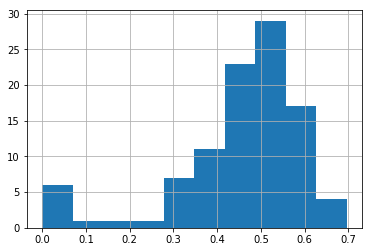

In [221]:
ds=pd.DataFrame(results, columns=['Rouge-1','Summary'])
ds['Rouge-1'].hist()

In [222]:
ds['Rouge-1'].describe()

count    100.000000
mean       0.452737
std        0.149356
min        0.000000
25%        0.408614
50%        0.484984
75%        0.551139
max        0.695925
Name: Rouge-1, dtype: float64

In [224]:
results=[]
counter=100
c=0
for t,a in zip(tqdm_notebook(df2.article_text[200:]), df2.abstract_text[200:]):
    try:
        r,s=summarize(t, a)
        results.append([r,s])
        c+=1
        print(c,'%',r,end='\r')
        if c==counter:
            break
    except:
        continue

W0716 02:39:54.388666 139621948430144 tokenization_utils.py:1329] Token indices sequence length is longer than the specified maximum sequence length for this model (598 > 512). Running this sequence through the model will result in indexing errors


W0716 05:46:50.651833 139621948430144 tokenization_utils.py:1329] Token indices sequence length is longer than the specified maximum sequence length for this model (606 > 512). Running this sequence through the model will result in indexing errors


W0716 05:59:08.229579 139621948430144 tokenization_utils.py:1329] Token indices sequence length is longer than the specified maximum sequence length for this model (575 > 512). Running this sequence through the model will result in indexing errors


W0716 06:17:08.248730 139621948430144 tokenization_utils.py:1329] Token indices sequence length is longer than the specified maximum sequence length for this model (594 > 512). Running this sequence through the model will result in indexing errors
